In [1]:
import pandas as pd #the csv reading library
import matplotlib as mpl
import matplotlib.pyplot as plt #the ploting library
import glob #to get file names
import numpy as np
from pandas import Series
import seaborn as sns
from matplotlib.pyplot import figure
import cmocean.cm as cmo
import seaborn as sns
from scipy.optimize import curve_fit
from itertools import product
from scipy.stats import linregress


In [2]:
df_meta = pd.read_csv('../Dissertation_projects/Data/meta_data.csv', sep=',', index_col=0)

#fix date time 
df_meta['date_time'] = pd.to_datetime(df_meta['Date'])
df_meta['Date'] = df_meta['date_time'].dt.date

df_meta

,Date,Trip,Station,Lat,Lon,Water_depth,Sample_depth,Sample_depth_units,Wavguide_Path_lengths,BC_time,BC_Chamber_vol_(L),Type,Waveguide_used,Notes,Flagged,Salinity,date_time
Sample,,,,,,,,,,,,,,,,,
211901,2021-07-15,GOM2021,St.MK,28.906820,-90.333160,16.7,16.7,M,NaN,NaN,NaN,NISK,NaN,NaN,NaN,35.223851,2021-07-15
211902,2021-07-15,GOM2021,St.MK,28.906820,-90.333163,16.7,16.7,M,NaN,NaN,NaN,NISK,NaN,NaN,NaN,35.183855,2021-07-15
211903,2021-07-15,GOM2021,St.MK,28.906660,-90.334096,16.7,14,M,NaN,NaN,NaN,NISK,NaN,NaN,NaN,34.505918,2021-07-15
211904,2021-07-15,GOM2021,St.MK,28.906660,-90.334119,16.7,14,M,NaN,NaN,NaN,NISK,NaN,NaN,NaN,34.486418,2021-07-15
211905,2021-07-15,GOM2021,St.MK,28.906531,-90.334841,16.7,10,M,NaN,NaN,NaN,NISK,NaN,NaN,NaN,32.824471,2021-07-15
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
225390,2022-07-23,GOM22SU,St.MK,NaN,NaN,NaN,30,CM,0.01,NaN,NaN,RHZ,1CM CUV,NaN,NaN,36.007597,2022-07-23
225391,2022-07-23,GOM22SU,St.MK,NaN,NaN,NaN,34,CM,0.01,NaN,NaN,RHZ,1CM CUV,NaN,NaN,36.007597,2022-07-23
225392,2022-07-23,GOM22SU,St.MK,NaN,NaN,NaN,38,CM,0.01,NaN,NaN,RHZ,1CM CUV,NaN,NaN,36.007597,2022-07-23


In [3]:
PW_CDOM_data = '../Dissertation_projects/Data/CDOM/sprectra_pchip_baseline_corrected_BC.csv'

df = pd.read_csv(PW_CDOM_data, sep=',', index_col=0)
df = pd.DataFrame(df)

wavelengths = list(range(250, 751))
wave_fit = list(range(450, 550))

#df = df.drop('file_id', axis = 1)

df.index = df.index.astype(str)
df_meta.index = df_meta.index.astype(str)

df = df.drop('224946')
df = df.drop('225250')

df.columns = ['a' + col for col in df.columns]

trips = ['GOM2021', 'GOM21FA', 'GOM22SP', 'GOM22SU']
stations = ['St.5B','St.4','St.MK','St.7','St.16','St.2','St.9','St.14','St.15','St.13','St.11','St.12']

df_cdom = df.join(df_meta, how='inner')

df_cdom['Sample_depth'] = pd.to_numeric(df_cdom['Sample_depth'], errors='coerce')
df_cdom['file_id'] = df_cdom['afile_id']
df_cdom = df_cdom.drop('afile_id', axis = 1)

df_cdom

,a250,a251,a252,a253,a254,a255,a256,a257,a258,a259,...,Wavguide_Path_lengths,BC_time,BC_Chamber_vol_(L),Type,Waveguide_used,Notes,Flagged,Salinity,date_time,file_id
Sample_ID,,,,,,,,,,,,,,,,,,,,,
211937,12.309252,10.357067,8.787713,7.491982,6.430447,5.546578,4.896499,4.300621,3.807397,3.406602,...,NaN,0.200000,0.056902,LANDSYR,NaN,BC1,NaN,35.223851,2021-07-16,BC_Abs_GoM21Su_ID211937_2_Absorbance_10-32-13-471
211937,15.259474,13.048613,11.156788,9.549894,8.273305,7.175086,6.295314,5.626407,5.047773,4.621939,...,NaN,0.200000,0.056902,LANDSYR,NaN,BC1,NaN,35.223851,2021-07-16,BC_Abs_GoM21Su_ID211937_Absorbance_23-16-43-897
211937,12.309252,10.357067,8.787713,7.491982,6.430447,5.546578,4.896499,4.300621,3.807397,3.406602,...,NaN,0.200000,0.056902,LANDSYR,NaN,BC1,NaN,35.223851,2021-07-16,BC_Abs_GoM21Su_ID211937_2_Absorbance_10-32-13-471
211937,15.259474,13.048613,11.156788,9.549894,8.273305,7.175086,6.295314,5.626407,5.047773,4.621939,...,NaN,0.200000,0.056902,LANDSYR,NaN,BC1,NaN,35.223851,2021-07-16,BC_Abs_GoM21Su_ID211937_Absorbance_23-16-43-897
211938,12.354495,10.327055,8.766885,7.454766,6.387681,5.526585,4.860042,4.272095,3.806505,3.410771,...,NaN,1.200000,0.056902,LANDSYR,NaN,BC2,NaN,35.223851,2021-07-16,BC_Abs_GoM21Su_ID211938_2_Absorbance_10-33-40-030
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
225358,5.128316,4.938816,4.610388,4.342086,4.126696,3.916576,3.729425,3.582413,3.472296,3.357711,...,0.489,13.233333,0.053721,LANDSYR,LWCC 50 CM #2,BC18,NaN,36.007597,2022-07-24,225358_1_61
225358,5.269960,4.898558,4.604576,4.339868,4.092743,3.905105,3.723305,3.581067,3.463600,3.331468,...,0.489,13.233333,0.053721,LANDSYR,LWCC 50 CM #2,BC18,NaN,36.007597,2022-07-24,225358_2_62
225358,5.171548,4.892104,4.610387,4.324504,4.118212,3.898919,3.717492,3.567526,3.452144,3.335508,...,0.489,13.233333,0.053721,LANDSYR,LWCC 50 CM #2,BC18,NaN,36.007597,2022-07-24,225358_0_60


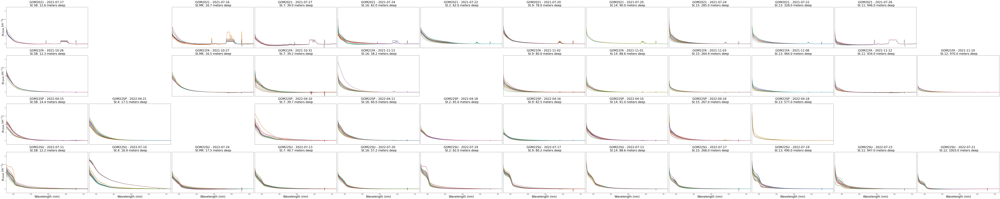

In [4]:
fig, axes = plt.subplots(len(trips), len(stations), figsize=(len(stations)*10, len(trips)*6))

for i, trip in enumerate(trips):
    for j, station in enumerate(stations):
        # Filter by trip and station
        subset_df = df_cdom[(df_cdom['Trip'] == trip) & (df_cdom['Station'] == station)]
        
        plotted = False  # Flag to check if something has been plotted

        # If any data exists for this combination
        if not subset_df.empty:
            for idx, row in subset_df.iterrows():
                cdom_abs = row[:501]  # Limit to the first 501 values
                cdom_abs = np.asarray(cdom_abs, dtype=float).ravel()
                wavelengths = np.asarray(wavelengths, dtype=float).ravel()
                date = row["Date"] 
                # Plot all rows in subset_df against wavelengths
                axes[i, j].plot(wavelengths, cdom_abs)  # use cdom_abs.values[0] to get the values of the row
                plotted = True
            axes[i,j].set_ylim(-1,9)
            axes[i,j].set_xlim(260,725)
            water_depth = df_meta[(df_meta['Trip'] == trip) & (df_meta['Station'] == station)]
            water_depth = water_depth['Water_depth'].mean()
            water_depth = round(water_depth, 1)
            axes[i, j].set_title(f'{trip} - {date} \n {station}: {water_depth} meters deep', size =25)
        else: 
            axes[i, j].axis('off')  # Turn off the axis if no data for that combination

            
        if j == 0:
            axes[i,j].set_ylabel(r'$a_{\mathrm{CDOM}}$ (m$^{-1}$)', size=25, c='black')
            axes[i,j].yaxis.set_tick_params(labelsize=10)
        else: 
            axes[i,j].set_ylabel('')
            axes[i,j].yaxis.set_ticklabels([])
            axes[i,j].set_yticks([])
        
        if i == 3:
            axes[i,j].set_xlabel('Wavelength (nm)', size=25, c='black')
            axes[i,j].xaxis.set_tick_params(labelsize=10)
        else: 
            axes[i,j].set_xlabel('')
            axes[i,j].xaxis.set_ticklabels([])
            axes[i,j].set_xticks([])

plt.tight_layout()
fig.set_facecolor('w')
plt.show()

In [5]:
#create the data for the normalization 
min_abs = df_cdom.iloc[:,:501].min().values
max_abs = df_cdom.iloc[:,:501].max().values
print(min_abs)
print(max_abs)

[-2.81965794e+01 -3.54607816e-01 -7.72916761e-02 -6.99318530e-02
 -4.36731419e-02  5.47522973e-01  5.61416595e-01  5.61416595e-01
  1.24213437e+00  1.07943771e+00  9.46351794e-01  8.50786268e-01
  6.49508212e-01  4.59928871e-01  3.14667434e-01  1.80945385e-01
  1.13902671e-01  2.85945861e-02 -1.67508305e-02 -6.31476918e-02
 -8.88840923e-02 -1.11441586e-01 -1.24775519e-01 -1.50222729e-01
 -1.57580323e-01 -1.58552130e-01 -1.67720678e-01 -1.78374115e-01
 -1.78529739e-01 -1.99576183e-01 -2.07650234e-01 -2.10683028e-01
 -1.92051047e-01 -2.12502984e-01 -2.24558420e-01 -2.37490404e-01
 -2.44893918e-01 -2.50562683e-01 -2.62812621e-01 -2.59068875e-01
 -2.65805610e-01 -2.66403053e-01 -2.65499863e-01 -2.82133121e-01
 -2.83797145e-01 -2.86573815e-01 -2.91571488e-01 -3.02984488e-01
 -2.96518076e-01 -3.01404936e-01 -2.96160025e-01 -2.97528328e-01
 -3.10181001e-01 -3.18249611e-01 -3.18841831e-01 -3.10606250e-01
 -3.15806030e-01 -3.12077512e-01 -3.13843490e-01 -3.17965259e-01
 -3.20897217e-01 -3.17793

In [6]:
##DEFINE EXPONENTAL REGRESSION 
#A(g)=Ae^slope
def exp_equation(x, a, s, b):
    return a * np.exp(-s * x) + b

#DEFINE HYPERBOLIC REGRESSION 
#A(g)=A(wl/532)^slope
def hyp_equation(x, a, s, b):
    return a * ((x/532)**-s) + b

#DEFINE POWER LAW REGRESSION 
def power_law(x, a, b):
    return a * (x**b)

print("the functions are set") 

the functions are set


C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\scipy\optimize\_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\scipy\optimize\_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\scipy\optimize\_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\scipy\optimize\_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\scipy\optimize\_minpack_py.py:1

C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\scipy\optimize\_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\scipy\optimize\_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\scipy\optimize\_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\scipy\optimize\_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\scipy\optimize\_minpack_py.py:1

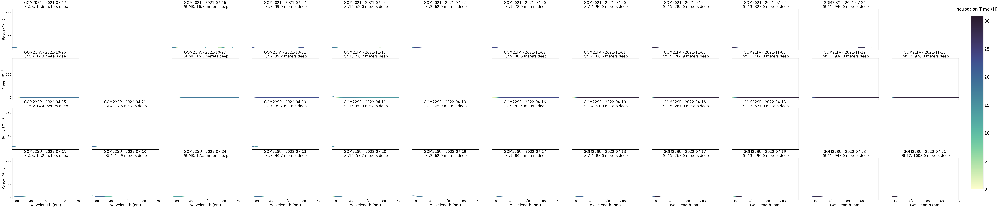

In [7]:
#Setup colormap and CDOM Spectra 

fig, axes = plt.subplots(len(trips), len(stations), figsize=(len(stations)*10, len(trips)*6))

for i, trip in enumerate(trips):
    for j, station in enumerate(stations):
        # Filter by trip and station
        subset_df = df_cdom[(df_cdom['Trip'] == trip) & (df_cdom['Station'] == station)]
        plotted = False

        if not subset_df.empty:
            for idx, row in subset_df.iterrows():
                #get the data
                cdom_abs = row[:501]
                cdom_abs = np.asarray(cdom_abs, dtype=float).ravel()
                
                #regression exp_equation 275 to 700
                pams = (.001, 11, 0)
                params, cv = curve_fit(exp_equation, wavelengths, cdom_abs, p0=pams, maxfev=10000000)
                a, s, b = params
    
                #print out for exp_equation 275 to 700 and calcuate rSquared
                norm_abs = cdom_abs - exp_equation(wavelengths, a, s, b)
                                
                depth = row["BC_time"]
                depth = np.full(501, depth)
                
                #get the date
                date = row["Date"]

                #color and plot:
                cmap=cmo.deep
                norm = plt.Normalize(vmin=-.3, vmax=df_cdom['BC_time'].max())
                color = cmap(norm(row["BC_time"]))
                axes[i, j].plot(wavelengths, norm_abs, color=color)
                
                plotted = True
            
            #set axis and lables 
            axes[i,j].set_ylim(-10,170)
            axes[i,j].set_xlim(275,700)
            water_depth = df_meta[(df_meta['Trip'] == trip) & (df_meta['Station'] == station)]
            water_depth = water_depth['Water_depth'].mean()
            water_depth = round(water_depth, 1)
            axes[i, j].set_title(f'{trip} - {date} \n {station}: {water_depth} meters deep', size=25)
        else: 
            axes[i, j].axis('off')

        #set y labes 
        if j == 0:
            axes[i,j].set_ylabel(r'$a_{\mathrm{CDOM}}$ (m$^{-1}$)', size=25, c='black')
            axes[i,j].yaxis.set_tick_params(labelsize=20)
        else: 
            axes[i,j].set_ylabel('')
            axes[i,j].yaxis.set_ticklabels([])
            axes[i,j].set_yticks([])
        
        #set x labes 
        if i == 3:
            axes[i,j].set_xlabel('Wavelength (nm)', size=25, c='black')
            axes[i,j].xaxis.set_tick_params(labelsize=20)
        else: 
            axes[i,j].set_xlabel('')
            axes[i,j].xaxis.set_ticklabels([])
            axes[i,j].set_xticks([])

#Add colorbar:
fig.subplots_adjust(right=0.89)
cbar_ax = fig.add_axes([.9, 0.15, 0.01, 0.7])
cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=cmo.deep, norm=plt.Normalize(vmin=0, vmax=df_cdom['BC_time'].max())), cax=cbar_ax)
cbar.ax.set_title(f'Incubation Time (H) \n', fontsize = 30)
cbar.ax.tick_params(labelsize=30)

#disply and save 
#plt.tight_layout()
fig.set_facecolor('w')

plt.savefig("../Dissertation_projects/Figures/350_inflec/Benthic_chamber_spectra_SEM.png")

plt.show()

C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\scipy\optimize\_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\scipy\optimize\_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\scipy\optimize\_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\scipy\optimize\_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\scipy\optimize\_minpack_py.py:1

C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\scipy\optimize\_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\scipy\optimize\_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\scipy\optimize\_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\scipy\optimize\_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\scipy\optimize\_minpack_py.py:1

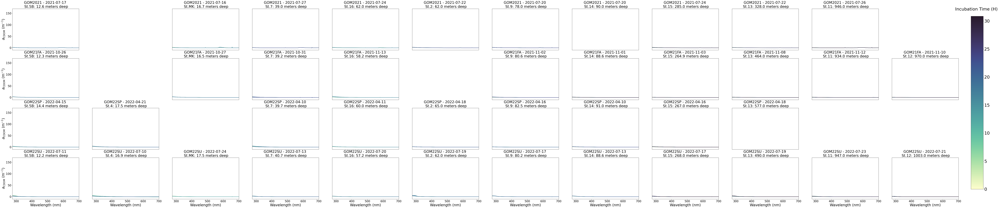

In [8]:
#Setup colormap and CDOM Spectra 

fig, axes = plt.subplots(len(trips), len(stations), figsize=(len(stations)*10, len(trips)*6))

for i, trip in enumerate(trips):
    for j, station in enumerate(stations):
        # Filter by trip and station
        subset_df = df_cdom[(df_cdom['Trip'] == trip) & (df_cdom['Station'] == station)]
        plotted = False

        if not subset_df.empty:
            for idx, row in subset_df.iterrows():
                #get the data
                cdom_abs_data = row[:501]
                cdom_fit_data = row[200:300]

                cdom_abs = np.asarray(cdom_abs_data, dtype=float).ravel()
                cdom_fit = np.asarray(cdom_fit_data, dtype=float).ravel()
                
                #regression exp_equation 275 to 700
                pams = (.001, 11, 0)
                params, cv = curve_fit(exp_equation, wave_fit, cdom_fit, p0=pams, maxfev=10000000)
                a, s, b = params
    
                #print out for exp_equation 275 to 700 and calcuate rSquared
                norm_abs = cdom_abs - exp_equation(wavelengths, a, s, b)
                                
                depth = row["BC_time"]
                depth = np.full(501, depth)
                
                #get the date
                date = row["Date"]

                #color and plot:
                cmap=cmo.deep
                norm = plt.Normalize(vmin=-.3, vmax=df_cdom['BC_time'].max())
                color = cmap(norm(row["BC_time"]))
                axes[i, j].plot(wavelengths, norm_abs, color=color)
                
                plotted = True
            
            #set axis and lables 
            axes[i,j].set_ylim(-10,170)
            axes[i,j].set_xlim(275,700)
            water_depth = df_meta[(df_meta['Trip'] == trip) & (df_meta['Station'] == station)]
            water_depth = water_depth['Water_depth'].mean()
            water_depth = round(water_depth, 1)
            axes[i, j].set_title(f'{trip} - {date} \n {station}: {water_depth} meters deep', size=25)
        else: 
            axes[i, j].axis('off')

        #set y labes 
        if j == 0:
            axes[i,j].set_ylabel(r'$a_{\mathrm{CDOM}}$ (m$^{-1}$)', size=25, c='black')
            axes[i,j].yaxis.set_tick_params(labelsize=20)
        else: 
            axes[i,j].set_ylabel('')
            axes[i,j].yaxis.set_ticklabels([])
            axes[i,j].set_yticks([])
        
        #set x labes 
        if i == 3:
            axes[i,j].set_xlabel('Wavelength (nm)', size=25, c='black')
            axes[i,j].xaxis.set_tick_params(labelsize=20)
        else: 
            axes[i,j].set_xlabel('')
            axes[i,j].xaxis.set_ticklabels([])
            axes[i,j].set_xticks([])

#Add colorbar:
fig.subplots_adjust(right=0.89)
cbar_ax = fig.add_axes([.9, 0.15, 0.01, 0.7])
cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=cmo.deep, norm=plt.Normalize(vmin=0, vmax=df_cdom['BC_time'].max())), cax=cbar_ax)
cbar.ax.set_title(f'Incubation Time (H) \n', fontsize = 30)
cbar.ax.tick_params(labelsize=30)

#disply and save 
#plt.tight_layout()
fig.set_facecolor('w')

plt.savefig("../Dissertation_projects/Figures/350_inflec/Benthic_chamber_spectra_SEM_450_550.png")

plt.show()

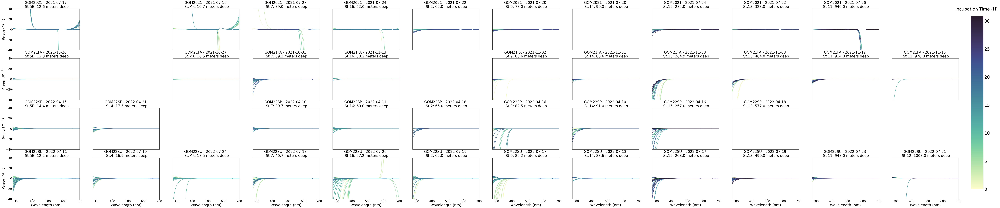

In [9]:
#Setup colormap and CDOM Spectra 

fig, axes = plt.subplots(len(trips), len(stations), figsize=(len(stations)*10, len(trips)*6))

for i, trip in enumerate(trips):
    for j, station in enumerate(stations):
        # Filter by trip and station
        subset_df = df_cdom[(df_cdom['Trip'] == trip) & (df_cdom['Station'] == station)]
        plotted = False

        if not subset_df.empty:
            for idx, row in subset_df.iterrows():
                #get the data
                cdom_abs_data = row[:501]
                cdom_fit_data = row[200:300]

                cdom_abs = np.asarray(cdom_abs_data, dtype=float).ravel()
                cdom_fit = np.asarray(cdom_fit_data, dtype=float).ravel()
                
                #regression exp_equation 275 to 700
                pams = (.001, 11, 0)
                params, cv = curve_fit(hyp_equation, wave_fit, cdom_fit, p0=pams, maxfev=10000000)
                a, s, b = params
    
                #print out for exp_equation 275 to 700 and calcuate rSquared
                norm_abs = cdom_abs - hyp_equation(wavelengths, a, s, b)
                                
                depth = row["BC_time"]
                depth = np.full(501, depth)
                
                #get the date
                date = row["Date"]

                #color and plot:
                cmap=cmo.deep
                norm = plt.Normalize(vmin=-.3, vmax=df_cdom['BC_time'].max())
                color = cmap(norm(row["BC_time"]))
                axes[i, j].plot(wavelengths, norm_abs, color=color)
                
                plotted = True
            
            #set axis and lables 
            axes[i,j].set_ylim(-40,40)
            axes[i,j].set_xlim(275,700)
            water_depth = df_meta[(df_meta['Trip'] == trip) & (df_meta['Station'] == station)]
            water_depth = water_depth['Water_depth'].mean()
            water_depth = round(water_depth, 1)
            axes[i, j].set_title(f'{trip} - {date} \n {station}: {water_depth} meters deep', size=25)
        else: 
            axes[i, j].axis('off')

        #set y labes 
        if j == 0:
            axes[i,j].set_ylabel(r'$a_{\mathrm{CDOM}}$ (m$^{-1}$)', size=25, c='black')
            axes[i,j].yaxis.set_tick_params(labelsize=20)
        else: 
            axes[i,j].set_ylabel('')
            axes[i,j].yaxis.set_ticklabels([])
            axes[i,j].set_yticks([])
        
        #set x labes 
        if i == 3:
            axes[i,j].set_xlabel('Wavelength (nm)', size=25, c='black')
            axes[i,j].xaxis.set_tick_params(labelsize=20)
        else: 
            axes[i,j].set_xlabel('')
            axes[i,j].xaxis.set_ticklabels([])
            axes[i,j].set_xticks([])

#Add colorbar:
fig.subplots_adjust(right=0.89)
cbar_ax = fig.add_axes([.9, 0.15, 0.01, 0.7])
cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=cmo.deep, norm=plt.Normalize(vmin=0, vmax=df_cdom['BC_time'].max())), cax=cbar_ax)
cbar.ax.set_title(f'Incubation Time (H) \n', fontsize = 30)
cbar.ax.tick_params(labelsize=30)

#disply and save 
#plt.tight_layout()
fig.set_facecolor('w')

plt.savefig("../Dissertation_projects/Figures/350_inflec/Benthic_chamber_spectra_HM_450_550.png")

plt.show()

C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\scipy\optimize\_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\scipy\optimize\_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\scipy\optimize\_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\scipy\optimize\_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\scipy\optimize\_minpack_py.py:1

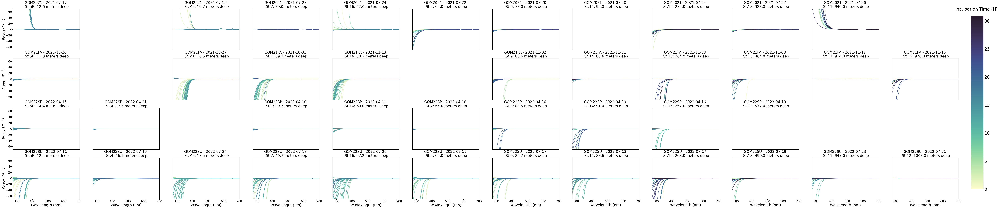

In [10]:
#Setup colormap and CDOM Spectra 

fig, axes = plt.subplots(len(trips), len(stations), figsize=(len(stations)*10, len(trips)*6))

for i, trip in enumerate(trips):
    for j, station in enumerate(stations):
        # Filter by trip and station
        subset_df = df_cdom[(df_cdom['Trip'] == trip) & (df_cdom['Station'] == station)]
        plotted = False

        if not subset_df.empty:
            for idx, row in subset_df.iterrows():
                #get the data
                cdom_abs_data = row[:501]
                cdom_fit_data = row[200:300]

                cdom_abs = np.asarray(cdom_abs_data, dtype=float).ravel()
                cdom_fit = np.asarray(cdom_fit_data, dtype=float).ravel()
                
                #regression exp_equation 275 to 700
                pams = (1, 0)
                params, cv = curve_fit(power_law, wave_fit, cdom_fit, p0=pams, maxfev=10000000)
                a, b = params
    
                #print out for exp_equation 275 to 700 and calcuate rSquared
                norm_abs = cdom_abs - power_law(wavelengths, a, b)
                                
                depth = row["BC_time"]
                depth = np.full(501, depth)
                
                #get the date
                date = row["Date"]

                #color and plot:
                cmap=cmo.deep
                norm = plt.Normalize(vmin=-.3, vmax=df_cdom['BC_time'].max())
                color = cmap(norm(row["BC_time"]))
                axes[i, j].plot(wavelengths, norm_abs, color=color)
                
                plotted = True
            
            #set axis and lables 
            axes[i,j].set_ylim(-70,70)
            axes[i,j].set_xlim(275,700)
            water_depth = df_meta[(df_meta['Trip'] == trip) & (df_meta['Station'] == station)]
            water_depth = water_depth['Water_depth'].mean()
            water_depth = round(water_depth, 1)
            axes[i, j].set_title(f'{trip} - {date} \n {station}: {water_depth} meters deep', size=25)
        else: 
            axes[i, j].axis('off')

        #set y labes 
        if j == 0:
            axes[i,j].set_ylabel(r'$a_{\mathrm{CDOM}}$ (m$^{-1}$)', size=25, c='black')
            axes[i,j].yaxis.set_tick_params(labelsize=20)
        else: 
            axes[i,j].set_ylabel('')
            axes[i,j].yaxis.set_ticklabels([])
            axes[i,j].set_yticks([])
        
        #set x labes 
        if i == 3:
            axes[i,j].set_xlabel('Wavelength (nm)', size=25, c='black')
            axes[i,j].xaxis.set_tick_params(labelsize=20)
        else: 
            axes[i,j].set_xlabel('')
            axes[i,j].xaxis.set_ticklabels([])
            axes[i,j].set_xticks([])

#Add colorbar:
fig.subplots_adjust(right=0.89)
cbar_ax = fig.add_axes([.9, 0.15, 0.01, 0.7])
cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=cmo.deep, norm=plt.Normalize(vmin=0, vmax=df_cdom['BC_time'].max())), cax=cbar_ax)
cbar.ax.set_title(f'Incubation Time (H) \n', fontsize = 30)
cbar.ax.tick_params(labelsize=30)

#disply and save 
#plt.tight_layout()
fig.set_facecolor('w')

plt.savefig("../Dissertation_projects/Figures/350_inflec/Benthic_chamber_spectra_PL_450_550.png")

plt.show()

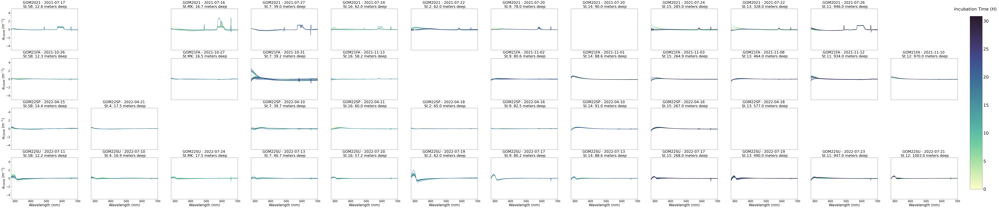

In [11]:
#Setup colormap and CDOM Spectra 

fig, axes = plt.subplots(len(trips), len(stations), figsize=(len(stations)*10, len(trips)*6))

for i, trip in enumerate(trips):
    for j, station in enumerate(stations):
        # Filter by trip and station
        subset_df = df_cdom[(df_cdom['Trip'] == trip) & (df_cdom['Station'] == station)]
        plotted = False

        if not subset_df.empty:
            for idx, row in subset_df.iterrows():
                #get the data
                cdom_abs = row[:501]
                cdom_abs = np.asarray(cdom_abs, dtype=float).ravel()
                
                #regression 
                pams = (.001, 11, 0)
                params, cv = curve_fit(hyp_equation, wavelengths, cdom_abs, p0=pams, maxfev=10000000)
                a, s, b = params
    
                #print out for exp_equation 275 to 700 and calcuate rSquared
                norm_abs = cdom_abs - hyp_equation(wavelengths, a, s, b)
                                
                depth = row["BC_time"]
                depth = np.full(501, depth)
                
                #get the date
                date = row["Date"]

                #color and plot:
                cmap=cmo.deep
                norm = plt.Normalize(vmin=-.3, vmax=df_cdom['BC_time'].max())
                color = cmap(norm(row["BC_time"]))
                axes[i, j].plot(wavelengths, norm_abs, color=color)
                
                plotted = True
            
            #set axis and lables 
            axes[i,j].set_ylim(-5,5)
            axes[i,j].set_xlim(275,700)
            water_depth = df_meta[(df_meta['Trip'] == trip) & (df_meta['Station'] == station)]
            water_depth = water_depth['Water_depth'].mean()
            water_depth = round(water_depth, 1)
            axes[i, j].set_title(f'{trip} - {date} \n {station}: {water_depth} meters deep', size=25)
        else: 
            axes[i, j].axis('off')

        #set y labes 
        if j == 0:
            axes[i,j].set_ylabel(r'$a_{\mathrm{CDOM}}$ (m$^{-1}$)', size=25, c='black')
            axes[i,j].yaxis.set_tick_params(labelsize=20)
        else: 
            axes[i,j].set_ylabel('')
            axes[i,j].yaxis.set_ticklabels([])
            axes[i,j].set_yticks([])
        
        #set x labes 
        if i == 3:
            axes[i,j].set_xlabel('Wavelength (nm)', size=25, c='black')
            axes[i,j].xaxis.set_tick_params(labelsize=20)
        else: 
            axes[i,j].set_xlabel('')
            axes[i,j].xaxis.set_ticklabels([])
            axes[i,j].set_xticks([])

#Add colorbar:
fig.subplots_adjust(right=0.89)
cbar_ax = fig.add_axes([.9, 0.15, 0.01, 0.7])
cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=cmo.deep, norm=plt.Normalize(vmin=0, vmax=df_cdom['BC_time'].max())), cax=cbar_ax)
cbar.ax.set_title(f'Incubation Time (H) \n', fontsize = 30)
cbar.ax.tick_params(labelsize=30)

#disply and save 
#plt.tight_layout()
fig.set_facecolor('w')

plt.savefig("../Dissertation_projects/Figures/350_inflec/Benthic_chamber_spectra_HM.png")

plt.show()

C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\scipy\optimize\_minpack_py.py:488: RuntimeWarning: overflow encountered in matmul
  cov_x = invR @ invR.T
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\scipy\optimize\_minpack_py.py:488: RuntimeWarning: overflow encountered in matmul
  cov_x = invR @ invR.T
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\scipy\optimize\_minpack_py.py:488: RuntimeWarning: overflow encountered in matmul
  cov_x = invR @ invR.T
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\scipy\optimize\_minpack_py.py:488: RuntimeWarning: overflow encountered in matmul
  cov_x = invR @ invR.T


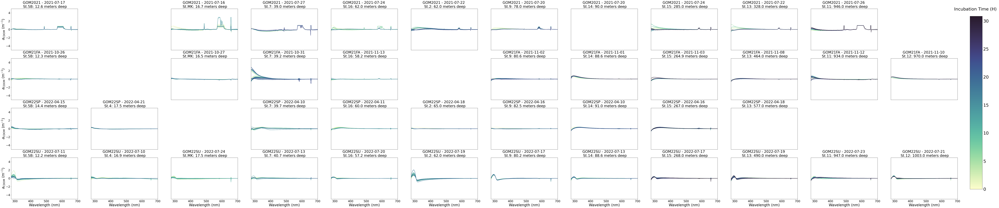

In [12]:
#Setup colormap and CDOM Spectra 

fig, axes = plt.subplots(len(trips), len(stations), figsize=(len(stations)*10, len(trips)*6))

for i, trip in enumerate(trips):
    for j, station in enumerate(stations):
        # Filter by trip and station
        subset_df = df_cdom[(df_cdom['Trip'] == trip) & (df_cdom['Station'] == station)]
        plotted = False

        if not subset_df.empty:
            for idx, row in subset_df.iterrows():
                
                #get the data
                cdom_abs = row[:501]
                cdom_abs = np.asarray(cdom_abs, dtype=float).ravel()
                
                #regression
                pams = (1, 0)
                params, cv = curve_fit(power_law, wavelengths, cdom_abs, p0=pams, maxfev=10000000)
                a, b = params
    
                #print out for exp_equation 275 to 700 and calcuate rSquared
                norm_abs = cdom_abs - power_law(wavelengths, a, b)
                                
                depth = row["BC_time"]
                depth = np.full(501, depth)
                
                #get the date
                date = row["Date"]

                #color and plot:
                cmap=cmo.deep
                norm = plt.Normalize(vmin=-.3, vmax=df_cdom['BC_time'].max())
                color = cmap(norm(row["BC_time"]))
                axes[i, j].plot(wavelengths, norm_abs, color=color)
                
                plotted = True
            
            #set axis and lables 
            axes[i,j].set_ylim(-5,5)
            axes[i,j].set_xlim(275,700)
            water_depth = df_meta[(df_meta['Trip'] == trip) & (df_meta['Station'] == station)]
            water_depth = water_depth['Water_depth'].mean()
            water_depth = round(water_depth, 1)
            axes[i, j].set_title(f'{trip} - {date} \n {station}: {water_depth} meters deep', size=25)
        else: 
            axes[i, j].axis('off')

        #set y labes 
        if j == 0:
            axes[i,j].set_ylabel(r'$a_{\mathrm{CDOM}}$ (m$^{-1}$)', size=25, c='black')
            axes[i,j].yaxis.set_tick_params(labelsize=20)
        else: 
            axes[i,j].set_ylabel('')
            axes[i,j].yaxis.set_ticklabels([])
            axes[i,j].set_yticks([])
        
        #set x labes 
        if i == 3:
            axes[i,j].set_xlabel('Wavelength (nm)', size=25, c='black')
            axes[i,j].xaxis.set_tick_params(labelsize=20)
        else: 
            axes[i,j].set_xlabel('')
            axes[i,j].xaxis.set_ticklabels([])
            axes[i,j].set_xticks([])

#Add colorbar:
fig.subplots_adjust(right=0.89)
cbar_ax = fig.add_axes([.9, 0.15, 0.01, 0.7])
cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=cmo.deep, norm=plt.Normalize(vmin=0, vmax=df_cdom['BC_time'].max())), cax=cbar_ax)
cbar.ax.set_title(f'Incubation Time (H) \n', fontsize = 30)
cbar.ax.tick_params(labelsize=30)

#disply and save 
#plt.tight_layout()
fig.set_facecolor('w')

plt.savefig("../Dissertation_projects/Figures/350_inflec/Benthic_chamber_spectra_PL.png")

plt.show()

In [13]:
trips = ['GOM2021', 'GOM21FA', 'GOM22SP', 'GOM22SU']
stations = ['St.5B','St.4','St.MK','St.7','St.16','St.2','St.9','St.14','St.15','St.13','St.11','St.12']

In [14]:
#Hyper
fig, axes = plt.subplots(len(trips), len(stations), figsize=(len(stations)*20, len(trips)*12))

for i, trip in enumerate(trips):
    for j, station in enumerate(stations):
        subset_df = df_cdom[(df_cdom['Trip'] == trip) & (df_cdom['Station'] == station)]
        plotted = False

        if not subset_df.empty:
            for idx, row in subset_df.iterrows():
                # Get the data
                cdom_abs = row[:501]
                cdom_abs = np.asarray(cdom_abs, dtype=float).ravel()
                
                #regression 
                pams = (.001, 11, 0)
                params, cv = curve_fit(hyp_equation, wavelengths, cdom_abs, p0=pams, maxfev=10000000)
                a, s, b = params
    
                #print out for exp_equation 275 to 700 and calcuate rSquared
                norm_abs = cdom_abs - hyp_equation(wavelengths, a, s, b)
                
                # Original plot of normalized data
                cmap=cmo.phase
                norm = plt.Normalize(vmin=-.3, vmax=df_cdom['BC_time'].max())
                color = cmap(norm(row["BC_time"]))
                axes[i, j].plot(wavelengths, norm_abs, color=color)
                
                plotted = True
                
                # Smoothing the data using rolling window
                window_size = 10  # You can adjust this based on your data
                smoothed_abs = pd.Series(norm_abs).rolling(window=window_size).mean().dropna()
                
                # Plotting the smoothed data
                wavelengths_smooth = np.linspace(250, 750, len(smoothed_abs))
                axes[i, j].plot(wavelengths_smooth, smoothed_abs, color='black', alpha=0.5)
                
                # Finding zeros in the smoothed data
                zero_crossings = np.where(np.diff(np.sign(smoothed_abs)))[0]
                # Plotting vertical lines at zero crossings of the smoothed data
                for zero in zero_crossings:
                    axes[i, j].axvline(wavelengths[window_size - 4 + zero], color=color, linestyle='-')
                
                #plot max 
                max_point = np.argmax(smoothed_abs)
                axes[i, j].axvline(wavelengths[window_size - 4 + max_point], color=color, linestyle='--')
                
                axes[i, j].axhline(0, color='grey', linestyle='-')

                # Set axis and labels
                axes[i,j].set_ylim(-70,70)
                axes[i,j].set_xlim(275,550)
                water_depth = df_meta[(df_meta['Trip'] == trip) & (df_meta['Station'] == station)]
                water_depth = water_depth['Water_depth'].mean()
                water_depth = round(water_depth, 1)
                axes[i, j].set_title(f'{trip} - {date} \n {station}: {water_depth} meters deep', size=25)
            else: 
                axes[i, j].axis('off')

            # Set y labels
            if j == 0:
                axes[i,j].set_ylabel(r'$a_{\mathrm{CDOM}}$ (m$^{-1}$)', size=25, c='black')
                axes[i,j].yaxis.set_tick_params(labelsize=20)
            else: 
                axes[i,j].set_ylabel('')
                axes[i,j].yaxis.set_ticklabels([])
                axes[i,j].set_yticks([])
            
            # Set x labels
            if i == 3:
                axes[i,j].set_xlabel('Wavelength (nm)', size=25, c='black')
                axes[i,j].xaxis.set_tick_params(labelsize=20)
            else: 
                axes[i,j].set_xlabel('')
                axes[i,j].xaxis.set_ticklabels([])
                axes[i,j].set_xticks([])
            

#Add colorbar:
fig.subplots_adjust(right=0.89)
cbar_ax = fig.add_axes([.9, 0.15, 0.01, 0.7])
cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=cmo.phase, norm=plt.Normalize(vmin=0, vmax=df_cdom['BC_time'].max())), cax=cbar_ax)
cbar.ax.set_title(f'Incubation Time (H) \n', fontsize = 30)
cbar.ax.tick_params(labelsize=30)
                
# Display and save
fig.set_facecolor('w')

plt.savefig("../Dissertation_projects/Figures/350_inflec/Benthic_chamber_Spectra_interects_HM.png")

plt.show()


In [15]:
#Power law  
fig, axes = plt.subplots(len(trips), len(stations), figsize=(len(stations)*20, len(trips)*12))

for i, trip in enumerate(trips):
    for j, station in enumerate(stations):
        subset_df = df_cdom[(df_cdom['Trip'] == trip) & (df_cdom['Station'] == station)]
        plotted = False

        if not subset_df.empty:
            for idx, row in subset_df.iterrows():
                # Get the data
                cdom_abs = row[:501]
                cdom_abs = np.asarray(cdom_abs, dtype=float).ravel()
                
                # Regression exp_equation 275 to 700
                pams = (1, 0)
                params, cv = curve_fit(power_law, wavelengths, cdom_abs, p0=pams, maxfev=10000000)
                a, b = params
                
                # Normalize absorption
                norm_abs = cdom_abs - power_law(wavelengths, a, b)
                
                # Original plot of normalized data
                cmap=cmo.phase
                norm = plt.Normalize(vmin=-.3, vmax=df_cdom['BC_time'].max())
                color = cmap(norm(row["BC_time"]))
                axes[i, j].plot(wavelengths, norm_abs, color=color)
                
                plotted = True
                
                # Smoothing the data using rolling window
                window_size = 10  # You can adjust this based on your data
                smoothed_abs = pd.Series(norm_abs).rolling(window=window_size).mean().dropna()
                
                # Plotting the smoothed data
                wavelengths_smooth = np.linspace(250, 750, len(smoothed_abs))
                axes[i, j].plot(wavelengths_smooth, smoothed_abs, color='black', alpha=0.5)
                
                # Finding zeros in the smoothed data
                zero_crossings = np.where(np.diff(np.sign(smoothed_abs)))[0]
                # Plotting vertical lines at zero crossings of the smoothed data
                for zero in zero_crossings:
                    axes[i, j].axvline(wavelengths[window_size - 4 + zero], color=color, linestyle='-')
                
                #plot max 
                max_point = np.argmax(smoothed_abs)
                axes[i, j].axvline(wavelengths[window_size - 4 + max_point], color=color, linestyle='--')
                
                axes[i, j].axhline(0, color='grey', linestyle='-')


                # Set axis and labels
                axes[i,j].set_ylim(-70,70)
                axes[i,j].set_xlim(275,550)
                water_depth = df_meta[(df_meta['Trip'] == trip) & (df_meta['Station'] == station)]
                water_depth = water_depth['Water_depth'].mean()
                water_depth = round(water_depth, 1)
                axes[i, j].set_title(f'{trip} - {date} \n {station}: {water_depth} meters deep', size=25)
            else: 
                axes[i, j].axis('off')

            # Set y labels
            if j == 0:
                axes[i,j].set_ylabel(r'$a_{\mathrm{CDOM}}$ (m$^{-1}$)', size=25, c='black')
                axes[i,j].yaxis.set_tick_params(labelsize=20)
            else: 
                axes[i,j].set_ylabel('')
                axes[i,j].yaxis.set_ticklabels([])
                axes[i,j].set_yticks([])
            
            # Set x labels
            if i == 3:
                axes[i,j].set_xlabel('Wavelength (nm)', size=25, c='black')
                axes[i,j].xaxis.set_tick_params(labelsize=20)
            else: 
                axes[i,j].set_xlabel('')
                axes[i,j].xaxis.set_ticklabels([])
                axes[i,j].set_xticks([])
            

#Add colorbar:
fig.subplots_adjust(right=0.89)
cbar_ax = fig.add_axes([.9, 0.15, 0.01, 0.7])
cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=cmo.phase, norm=plt.Normalize(vmin=0, vmax=df_cdom['BC_time'].max())), cax=cbar_ax)
cbar.ax.set_title(f'Incubation Time (H) \n', fontsize = 30)
cbar.ax.tick_params(labelsize=30)
                
# Display and save
fig.set_facecolor('w')

plt.savefig("../Dissertation_projects/Figures/350_inflec/Benthic_chamber_Spectra_interects_PL.png")

plt.show()


C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\scipy\optimize\_minpack_py.py:488: RuntimeWarning: overflow encountered in matmul
  cov_x = invR @ invR.T
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\scipy\optimize\_minpack_py.py:488: RuntimeWarning: overflow encountered in matmul
  cov_x = invR @ invR.T
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\scipy\optimize\_minpack_py.py:488: RuntimeWarning: overflow encountered in matmul
  cov_x = invR @ invR.T
C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\scipy\optimize\_minpack_py.py:488: RuntimeWarning: overflow encountered in matmul
  cov_x = invR @ invR.T


In [21]:
#Hyper  
df_cdom['sample_id'] = df_cdom.index

frames = []

for idx, row in df_cdom.iterrows():
    # Get the data
    cdom_abs = row[:501]
    cdom_abs = np.asarray(cdom_abs, dtype=float).ravel()
    
    #regression 
    pams = (.001, 11, 0)
    params, cv = curve_fit(hyp_equation, wavelengths, cdom_abs, p0=pams, maxfev=10000000)
    a, s, b = params
    
    #print out for exp_equation 
    norm_abs = cdom_abs - hyp_equation(wavelengths, a, s, b)
    
    # Smoothing the data using rolling window
    window_size = 10  # You can adjust this based on your data
    smoothed_abs = pd.Series(norm_abs).rolling(window=window_size).mean().dropna()
    
   # Finding zeros in the smoothed data
    zero_crossings = np.where(np.diff(np.sign(smoothed_abs)))[0]

    # Splitting zero crossings based on their position value
    zero_cross_low = zero_crossings[zero_crossings < 100]
    zero_cross_high = zero_crossings[(zero_crossings > 100) & (zero_crossings < 250)]

    # Initial default values
    zero_cross_high_max = None
    zero_cross_low_min = None

    # Finding the max and min values if possible
    if zero_cross_high.size > 0 and zero_cross_low.size > 0: 
        zero_cross_high_max = max(zero_cross_high)
        zero_cross_low_min = min(zero_cross_low)
    
        max_point = np.argmax(smoothed_abs[zero_cross_low_min:zero_cross_high_max])
    else:
        max_point = np.nan

    # Get the max value between zero_cross_low_min and zero_cross_high_max
    if zero_cross_high_max is not None and zero_cross_low_min is not None:
        max_val = smoothed_abs[zero_cross_low_min:zero_cross_high_max].max()
    else:
        max_val = np.nan

    len_zero_cross = len(zero_crossings)
    
    sample_id = row['sample_id']
    f_id = row['file_id']
    Sample_depth = row['BC_time']
    Trip = row['Trip']
    Station = row['Station']
    a440 = row['a440']
    a350 = row['a350']

    
    d = {'sample_id_hm': sample_id, 
         'low_wl_hm': [zero_cross_low+246],
         'max_wl_hm': [max_point+246], 
         'high_wl_hm': [zero_cross_high+246],
         'max_val_sm_hm':[max_val], 
         'len_zero_cross_hm': len_zero_cross,
         'file_id_hm': f_id,
         'BC_time':Sample_depth, 
         'Trip': Trip,
         'Station': Station,
         'a450': a440, 
         'a350': a350}
    df = pd.DataFrame(data=d)
    
    frames.append(df) # adds the new col from each scan to a part of frames 
df_hm_pre = pd.concat(frames, axis=0, ignore_index=False)
#print(len(df))
#df = df[df['len_zero_cross'] != 1]
#print(len(df))
#df = df[df['max_wl'] <= 450]
#print(len(df))
#df = df[df['max_val_sm'] >= 0]
#print(len(df))
#df = df[df['len_zero_cross'] <= 5]
print(len(df_hm_pre))

df_hm_pre

1841


,sample_id_hm,low_wl_hm,max_wl_hm,high_wl_hm,max_val_sm_hm,len_zero_cross_hm,file_id_hm,BC_time,Trip,Station,a450,a350
0,211937,[258],263.0,"[353, 475, 481]",0.720769,8,BC_Abs_GoM21Su_ID211937_2_Absorbance_10-32-13-471,0.200000,GOM2021,St.MK,-0.027101,0.217713
0,211937,"[260, 345]",264.0,"[473, 481]",0.859249,8,BC_Abs_GoM21Su_ID211937_Absorbance_23-16-43-897,0.200000,GOM2021,St.MK,-0.107900,0.241905
0,211937,[258],263.0,"[353, 475, 481]",0.720769,8,BC_Abs_GoM21Su_ID211937_2_Absorbance_10-32-13-471,0.200000,GOM2021,St.MK,-0.027101,0.217713
0,211937,"[260, 345]",264.0,"[473, 481]",0.859249,8,BC_Abs_GoM21Su_ID211937_Absorbance_23-16-43-897,0.200000,GOM2021,St.MK,-0.107900,0.241905
0,211938,[258],264.0,[353],0.728568,6,BC_Abs_GoM21Su_ID211938_2_Absorbance_10-33-40-030,1.200000,GOM2021,St.MK,-0.012710,0.217548
...,...,...,...,...,...,...,...,...,...,...,...,...
0,225358,"[246, 263, 298]",NaN,[],NaN,6,225358_1_61,13.233333,GOM22SU,St.MK,0.051787,0.404565
0,225358,"[246, 263, 298]",NaN,[],NaN,4,225358_2_62,13.233333,GOM22SU,St.MK,0.044705,0.395130
0,225358,"[246, 263, 298]",NaN,[],NaN,4,225358_0_60,13.233333,GOM22SU,St.MK,0.050059,0.401539
0,225358,"[246, 263, 298]",NaN,[],NaN,4,225358_1_61,13.233333,GOM22SU,St.MK,0.050352,0.402407


In [22]:
#Power law 
df_cdom['sample_id'] = df_cdom.index

frames = []

for idx, row in df_cdom.iterrows():
    # Get the data
    cdom_abs = row[:501]
    cdom_abs = np.asarray(cdom_abs, dtype=float).ravel()
                
    # Regression exp_equation 275 to 700
    pams = (1, 0)
    params, cv = curve_fit(power_law, wavelengths, cdom_abs, p0=pams, maxfev=10000000)
    a, b = params
                
    # Normalize absorption
    norm_abs = cdom_abs - power_law(wavelengths, a, b)
                
    # Smoothing the data using rolling window
    window_size = 10  # You can adjust this based on your data
    smoothed_abs = pd.Series(norm_abs).rolling(window=window_size).mean().dropna()
    
    # Finding zeros in the smoothed data
    zero_crossings = np.where(np.diff(np.sign(smoothed_abs)))[0]

    # Splitting zero crossings based on their position value
    zero_cross_low = zero_crossings[zero_crossings < 100]
    zero_cross_high = zero_crossings[(zero_crossings > 100) & (zero_crossings < 250)]

    # Initial default values
    zero_cross_high_max = None
    zero_cross_low_min = None

    # Finding the max and min values if possible
    if zero_cross_high.size > 0 and zero_cross_low.size > 0: 
        zero_cross_high_max = max(zero_cross_high)
        zero_cross_low_min = min(zero_cross_low)
    
        max_point = np.argmax(smoothed_abs[zero_cross_low_min:zero_cross_high_max])
    else:
        max_point = np.nan

    # Get the max value between zero_cross_low_min and zero_cross_high_max
    if zero_cross_high_max is not None and zero_cross_low_min is not None:
        max_val = smoothed_abs[zero_cross_low_min:zero_cross_high_max].max()
    else:
        max_val = np.nan

    len_zero_cross = len(zero_crossings)
    
    sample_id = row['sample_id']
    f_id = row['file_id']
    Sample_depth = row['BC_time']
    Trip = row['Trip']
    Station = row['Station']
    a440 = row['a440']
    a350 = row['a350']

    
    d = {'sample_id_pl': sample_id, 
         'low_wl_pl': [zero_cross_low+246],
         'max_wl_pl': [max_point+246], 
         'high_wl_pl': [zero_cross_high+246],
         'max_val_sm_pl':[max_val], 
         'len_zero_cross_pl': len_zero_cross,
         'file_id_pl': f_id,
         'BC_time':Sample_depth, 
         'Trip': Trip,
         'Station': Station,
         'a440': a440, 
         'a350': a350}
    df = pd.DataFrame(data=d)
    
    frames.append(df) # adds the new col from each scan to a part of frames 
df_pl_pre = pd.concat(frames, axis=0, ignore_index=False)
#print(len(df))
#df = df[df['len_zero_cross'] != 1]
#print(len(df))
#df = df[df['max_wl'] <= 450]
#print(len(df))
#df = df[df['max_val_sm'] >= 0]
#print(len(df))
#df = df[df['len_zero_cross'] <= 5]
print(len(df_pl_pre))
print(len(df_hm_pre))

df_pl_pre

C:\Users\hmlbr\anaconda3\envs\bugs\Lib\site-packages\scipy\optimize\_minpack_py.py:488: RuntimeWarning: overflow encountered in matmul
  cov_x = invR @ invR.T


1841
1841


,sample_id_pl,low_wl_pl,max_wl_pl,high_wl_pl,max_val_sm_pl,len_zero_cross_pl,file_id_pl,BC_time,Trip,Station,a440,a350
0,211937,[259],265.0,"[395, 471]",0.762918,14,BC_Abs_GoM21Su_ID211937_2_Absorbance_10-32-13-471,0.200000,GOM2021,St.MK,-0.027101,0.217713
0,211937,[262],265.0,"[377, 472, 483, 488]",0.825986,12,BC_Abs_GoM21Su_ID211937_Absorbance_23-16-43-897,0.200000,GOM2021,St.MK,-0.107900,0.241905
0,211937,[259],265.0,"[395, 471]",0.762918,14,BC_Abs_GoM21Su_ID211937_2_Absorbance_10-32-13-471,0.200000,GOM2021,St.MK,-0.027101,0.217713
0,211937,[262],265.0,"[377, 472, 483, 488]",0.825986,12,BC_Abs_GoM21Su_ID211937_Absorbance_23-16-43-897,0.200000,GOM2021,St.MK,-0.107900,0.241905
0,211938,[259],265.0,"[394, 471]",0.766057,12,BC_Abs_GoM21Su_ID211938_2_Absorbance_10-33-40-030,1.200000,GOM2021,St.MK,-0.012710,0.217548
...,...,...,...,...,...,...,...,...,...,...,...,...
0,225358,"[263, 299]",NaN,[],NaN,15,225358_1_61,13.233333,GOM22SU,St.MK,0.051787,0.404565
0,225358,"[263, 299]",NaN,[],NaN,19,225358_2_62,13.233333,GOM22SU,St.MK,0.044705,0.395130
0,225358,"[263, 299]",NaN,[],NaN,15,225358_0_60,13.233333,GOM22SU,St.MK,0.050059,0.401539
0,225358,"[263, 299]",NaN,[],NaN,17,225358_1_61,13.233333,GOM22SU,St.MK,0.050352,0.402407


In [23]:
df_hm = df_hm_pre
df_pl = df_pl_pre

print('')
print('fixed index')
print('--')

df_pl.index = df_pl['sample_id_pl']
df_hm.index = df_hm['sample_id_hm']

print(len(df_pl))
print(len(df_hm))

print('')
print('clean up the Power Law data set')
print('--')

#clean up the data set 
print(len(df_pl))
df_pl = df_pl[df_pl['max_wl_pl'].notna()]
print(len(df_pl))
df_pl = df_pl[df_pl['max_val_sm_pl'].notna()]
print(len(df_pl))
df_pl = df_pl[df_pl['low_wl_pl'].astype(str) != '[]']  # Drop empty arrays
df_pl = df_pl[df_pl['low_wl_pl'].astype(str) != '']  # Drop empty strings
print(len(df_pl))
df_pl = df_pl[df_pl['high_wl_pl'].astype(str) != '[]']  # Drop empty arrays
df_pl = df_pl[df_pl['high_wl_pl'].astype(str) != '']  # Drop empty strings
print(len(df_pl))

print('')
print('clean up the Hyperbolic model data set')
print('--')

#clean up the data set 
print(len(df_hm))
df_hm = df_hm[df_hm['max_wl_hm'].notna()]
print(len(df_hm))
df_hm = df_hm[df_hm['max_val_sm_hm'].notna()]
print(len(df_hm))
df_hm = df_hm[df_hm['low_wl_hm'].astype(str) != '[]']  # Drop empty arrays
df_hm = df_hm[df_hm['low_wl_hm'].astype(str) != '']  # Drop empty strings
print(len(df_hm))
df_hm = df_hm[df_hm['high_wl_hm'].astype(str) != '[]']  # Drop empty arrays
df_hm = df_hm[df_hm['high_wl_hm'].astype(str) != '']  # Drop empty strings
print(len(df_hm))


print('')
print('Compute cartesian product for each row in Power Law data set')
print('--')
print(len(df_pl))
# Compute cartesian product for each row
df_pl['product'] = df_pl.apply(lambda row: list(product(row['low_wl_pl'], row['high_wl_pl'])), axis=1)
# Explode product column to get individual pairs
df_pl = df_pl.explode('product')
# Separate the product pairs into the original columns
df_pl['low_wl_pl'] = df_pl['product'].apply(lambda x: x[0])
df_pl['high_wl_pl'] = df_pl['product'].apply(lambda x: x[1])
# Drop the temporary product column
df_pl = df_pl.drop(columns='product')
print(len(df_pl))

print('')
print('Compute cartesian product for each row in Hyperbolic model data set')
print('--')
print(len(df_hm))
# Compute cartesian product for each row
df_hm['product'] = df_hm.apply(lambda row: list(product(row['low_wl_hm'], row['high_wl_hm'])), axis=1)
# Explode product column to get individual pairs
df_hm = df_hm.explode('product')
# Separate the product pairs into the original columns
df_hm['low_wl_hm'] = df_hm['product'].apply(lambda x: x[0])
df_hm['high_wl_hm'] = df_hm['product'].apply(lambda x: x[1])
# Drop the temporary product column
df_hm = df_hm.drop(columns='product')
print(len(df_hm))


print('')
print('Compute Triangel area for each row in Power Law data set')
print('--')
#math 
df_pl['range_pl'] = df_pl['high_wl_pl'] - df_pl['low_wl_pl']
df_pl['range_low_pl'] = df_pl['max_wl_pl'] - df_pl['low_wl_pl']
df_pl['range_high_pl'] = df_pl['high_wl_pl'] - df_pl['max_wl_pl']
df_pl['Triangel_pl'] = ((df_pl['range_low_pl']*df_pl['max_val_sm_pl'])*2) + ((df_pl['range_high_pl']*df_pl['max_val_sm_pl'])*2)

print('done')

print('')
print('Compute Triangel area for each row in Hyperbolic model data set')
print('--')
#math
df_hm['range_hm'] = df_hm['high_wl_hm'] - df_hm['low_wl_hm']
df_hm['range_low_hm'] = df_hm['max_wl_hm'] - df_hm['low_wl_hm']
df_hm['range_high_hm'] = df_hm['high_wl_hm'] - df_hm['max_wl_hm']
df_hm['Triangel_hm'] = ((df_hm['range_low_hm']*df_hm['max_val_sm_hm'])*2) + ((df_hm['range_high_hm']*df_hm['max_val_sm_hm'])*2)

print('done')



fixed index
--
1841
1841

clean up the Power Law data set
--
1841
587
587
587
587

clean up the Hyperbolic model data set
--
1841
1369
1369
1369
1369

Compute cartesian product for each row in Power Law data set
--
587
2666

Compute cartesian product for each row in Hyperbolic model data set
--
1369
5147

Compute Triangel area for each row in Power Law data set
--
done

Compute Triangel area for each row in Hyperbolic model data set
--
done


In [24]:
df_iron = pd.read_csv('../Dissertation_projects/Data/IRON/Iron.csv', sep=',', index_col=0)

#make all the spots labeled NA a nan value
df_iron = df_iron.replace('NA', np.nan)
df_iron = df_iron.replace('NA ', np.nan)

#make all BDL a 0 
df_iron.loc[df_iron['FeT_uM'] == 'BLD', 'FeT_uM'] = 0
df_iron.loc[df_iron['Fe2_uM'] == 'BLD', 'Fe2_uM'] = 0

# convert columns to numeric data type
df_iron['FeT_uM'] = pd.to_numeric(df_iron['FeT_uM'], errors='coerce')
df_iron['Fe2_uM'] = pd.to_numeric(df_iron['Fe2_uM'], errors='coerce')

df_iron['FeT_uM'] = df_iron['FeT_uM'].where(pd.notna(df_iron['FeT_uM']), other=np.nan)
df_iron['Fe2_uM'] = df_iron['Fe2_uM'].where(pd.notna(df_iron['Fe2_uM']), other=np.nan)

#make all negative a 0 
df_iron.loc[df_iron['FeT_uM'] < 0, 'FeT_uM'] = 0
df_iron.loc[df_iron['Fe2_uM'] < 0, 'Fe2_uM'] = 0

#calculate Fe +3 
df_iron['Fe3_uM'] = df_iron['FeT_uM'] - df_iron['Fe2_uM']
df_iron.loc[df_iron['Fe3_uM'] < 0, 'Fe3_uM'] = 0
df_iron.loc[df_iron['Fe2_uM'] > df_iron['FeT_uM'], 'Fe3_uM'] = 0
df_iron['Fe3_uM'] = pd.to_numeric(df_iron['Fe3_uM'], errors='coerce')
df_iron['Fe3_uM'] = df_iron['Fe3_uM'].where(pd.notna(df_iron['Fe3_uM']), other=np.nan)

#time feild 
df_iron['Fe2_Time'] = pd.to_numeric(df_iron['Fe2_Time'], errors='coerce')
df_iron['Fe2_Time'] = df_iron['Fe2_Time'].where(pd.notna(df_iron['Fe2_Time']), other=np.nan)

#time feild 
df_iron['FeT_Time'] = pd.to_numeric(df_iron['FeT_Time'], errors='coerce')
df_iron['FeT_Time'] = df_iron['FeT_Time'].where(pd.notna(df_iron['FeT_Time']), other=np.nan)

# convert columns to numeric data type
df_iron['FeT_Depth'] = pd.to_numeric(df_iron['Fe2_Depth'], errors='coerce')
df_iron['Fe2_Depth'] = pd.to_numeric(df_iron['Fe2_Depth'], errors='coerce')

df_iron['FeT_uM'] = df_iron['FeT_uM'].replace(0, np.nan)
df_iron['Fe2_uM'] = df_iron['Fe2_uM'].replace(0, np.nan)
df_iron['Fe3_uM'] = df_iron['Fe3_uM'].replace(0, np.nan)

df_iron['code'] = df_iron['Location'] + '_' + df_iron['Campaign']

df_iron_bc = df_iron[df_iron['Type'] == 'BC']
df_iron_bc

,Treatment,Campaign,Location,Type,FeT_Date,FeT_uM,FeT_mgL,FeT_Notes,FeT_Depth,FeT_Time,Fe2_Date,Fe2_uM,Fe2_mgL,Fe2_Notes,Fe2_Depth,Fe2_Time,Fe3_uM,code
Sample_ID,,,,,,,,,,,,,,,,,,
211937,P2F,GOM2021,St.MK,BC,7/16/2021,0.046008,NaN,MK 1,NaN,0.200000,7/16/2021,0.135218,NaN,MK 1,NaN,0.200000,NaN,St.MK_GOM2021
211938,P2F,GOM2021,St.MK,BC,7/16/2021,0.092015,NaN,MK 2,NaN,1.200000,7/16/2021,0.090146,NaN,MK 2,NaN,1.200000,0.001870,St.MK_GOM2021
211939,P2F,GOM2021,St.MK,BC,7/16/2021,0.184030,NaN,MK 3,NaN,2.200000,7/16/2021,0.090146,NaN,MK 3,NaN,2.200000,0.093885,St.MK_GOM2021
211940,P2F,GOM2021,St.MK,BC,7/16/2021,0.069011,NaN,MK 4,NaN,3.200000,7/16/2021,0.112682,NaN,MK 4,NaN,3.200000,NaN,St.MK_GOM2021
211941,P2F,GOM2021,St.MK,BC,7/16/2021,0.069011,NaN,MK 5,NaN,4.200000,7/16/2021,0.067609,NaN,MK 5,NaN,4.200000,0.001402,St.MK_GOM2021
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
225354,P2F,GOM22SU,St.MK,BC,7/24/2022,0.058750,0.00328,NaN,NaN,10.166667,7/24/2022,0.007000,0.0004,NaN,NaN,10.166667,0.051750,St.MK_GOM22SU
225355,P2F,GOM22SU,St.MK,BC,7/24/2022,0.054970,0.00307,NaN,NaN,10.933333,7/24/2022,0.004000,0.00025,NaN,NaN,10.933333,0.050970,St.MK_GOM22SU
225356,P2F,GOM22SU,St.MK,BC,7/24/2022,0.056550,0.00316,NaN,NaN,11.700000,7/24/2022,0.011000,0.0006,NaN,NaN,11.700000,0.045550,St.MK_GOM22SU


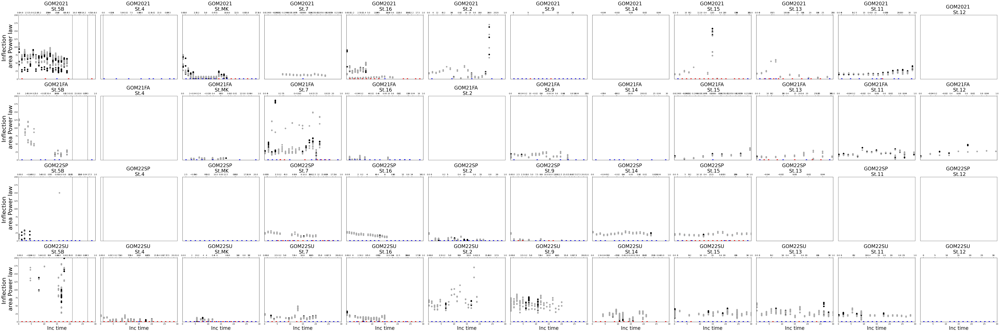

In [25]:
# Assuming you have already imported the required libraries and the datasets

#Power law  
fig, axes = plt.subplots(len(trips), len(stations), figsize=(len(stations)*6, len(trips)*6))

for i, trip in enumerate(trips):
    for j, station in enumerate(stations):
        
        subset_df = df_pl[(df_pl['Trip'] == trip) & (df_pl['Station'] == station)]
        subset_df_hm = df_hm[(df_hm['Trip'] == trip) & (df_hm['Station'] == station)]
        subset_iron = df_iron_bc[(df_iron_bc['Campaign'] == trip) & (df_iron_bc['Location'] == station)]
        
        if not subset_df.empty:
            # Vectorized plotting
            axes[i, j].scatter(subset_df["BC_time"], subset_df["Triangel_pl"], color='black', s = 50)
            
        if not subset_df.empty:
            # Vectorized plotting
            axes4 = axes[i, j].twiny()
            axes[i, j].scatter(subset_df_hm["BC_time"], subset_df_hm["Triangel_hm"], color='darkgray', s =50)

        if not subset_iron.empty:
            axes2 = axes[i, j].twiny()
            axes3 = axes[i, j].twiny()

            axes2.scatter(subset_iron["FeT_Time"], subset_iron["FeT_uM"], color='r', s = 50)
            axes3.scatter(subset_iron["Fe2_Time"], subset_iron["Fe2_uM"], color='b', s = 50)

        # Set common properties outside if-conditions
        axes[i,j].set_ylim(0, 1000)
        axes[i,j].set_xlim(0,30)
        axes[i, j].set_title(f'{trip} \n {station}', size=25)
        
        axes[i, j].set_ylabel('')
        axes[i, j].tick_params(axis='y', length=0, width=0)
        
        if i == 3:
            axes[i,j].set_xlabel('Inc time', size=25, c='black')
        else:
            axes[i,j].xaxis.set_ticklabels([])
            axes[i,j].set_xticks([])

        if j == 0:
            axes[i,j].set_ylabel(f'Inflection \n area Power law', size=30, c='black')
            #axes[i,j].spines["left"].set_position(("axes", 1))
            axes4.set_ylabel(f'Inflection area \n Hyper Model', size=30, c='darkgray')
            axes4.yaxis.set_ticks_position('left')
            axes4.yaxis.set_label_position('left')
            axes4.spines["left"].set_position(("axes", .9))
            
            axes2.set_ylabel('Fe(III) (\u03BCM)', size=25, c='r')
            axes2.yaxis.set_ticks_position('left')
            axes2.yaxis.set_label_position('left')
            axes2.spines["left"].set_position(("axes", 1.1))
            axes2.set_ylim(0, 200)
            
            axes3.set_ylabel('Fe(II) (\u03BCM)', size=25, c='b')
            axes3.yaxis.set_ticks_position('left')
            axes3.yaxis.set_label_position('left')
            axes3.spines["left"].set_position(("axes", .7))
            axes3.set_ylim(0, 200)
        else:
            axes[i,j].yaxis.set_ticklabels([])
            axes[i,j].set_yticks([])
            if not subset_iron.empty:
                axes2.yaxis.set_ticklabels([])
                axes2.set_yticks([])
                axes3.yaxis.set_ticklabels([])
                axes3.set_yticks([])

# Display and save
fig.set_facecolor('w')
plt.tight_layout()

plt.savefig("../Dissertation_projects/Figures/350_inflec/Benthic_chamber_FE_triangel_profiles.png")

plt.show()

df_c = pd.read_csv('../Dissertation_projects/Data/CDOM/Outputs.csv', sep=',', index_col=0)

df_c['Sample_idx'] = df_c.index.astype(object)
df_meta['Sample_idx'] = df_meta.index.astype(object)

df_c.index = df_c['file_id']

df_cdom = df_c.merge(df_meta, on="Sample_idx", how="left")

df_cdom.index = df_cdom['Sample_idx']
df_cdom['Sample'] = df_cdom.index
df_cdom.index = df_cdom['Sample']
df_cdom = df_cdom.drop('Sample_idx', axis = 1)
df_meta = df_meta.drop('Sample_idx', axis = 1)

df_cdom['Sample_depth'] = pd.to_numeric(df_cdom['Sample_depth'], errors='coerce')

df_cdom = df_cdom[df_cdom['Type'] == 'LANDSYR']

df_cdom.columns

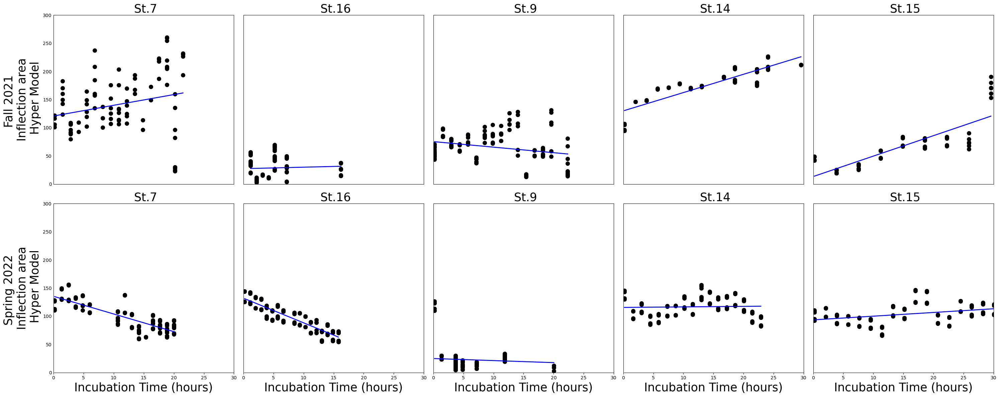

In [26]:
trips = ['GOM21FA','GOM22SP']
stations = ['St.7','St.16','St.9','St.14','St.15',]

fig, axes = plt.subplots(len(trips), len(stations), figsize=(len(stations)*6, len(trips)*6))

for i, trip in enumerate(trips):
    for j, station in enumerate(stations):
        
        subset_df_hm = df_hm[(df_hm['Trip'] == trip) & (df_hm['Station'] == station)]
        subset_df_hm = subset_df_hm[(subset_df_hm['Triangel_hm'] < 400) & (subset_df_hm['Triangel_hm'] < 400)]
        
        axes[i, j].scatter(subset_df_hm["BC_time"], subset_df_hm["Triangel_hm"], color='black', s = 70)
    
        # Set common properties outside if-conditions
        axes[i,j].set_ylim(0, 300)
        axes[i,j].set_xlim(0,30)
        axes[i, j].set_title(f' {station}', size=25)
        
        axes[i, j].set_ylabel('')
        axes[i, j].tick_params(axis='y', length=0, width=0)
        
        clean_data = subset_df_hm[["BC_time", "Triangel_hm"]].dropna()
        if len(clean_data) > 10: 
            slope_fe2, intercept_fe2, r_value_fe2, _, _ = linregress(clean_data["BC_time"], clean_data["Triangel_hm"])
            x_range_fe2 = np.linspace(clean_data["BC_time"].min(), clean_data["BC_time"].max(), 100)
            axes[i, j].plot(x_range_fe2, slope_fe2*x_range_fe2 + intercept_fe2, color='b', linewidth=2)
        
        if i == 1:
            axes[i,j].set_xlabel('Incubation Time (hours)', size=25, c='black')
        else:
            axes[i,j].xaxis.set_ticklabels([])
            axes[i,j].set_xticks([])

        if j == 0:
            if i == 0:
                axes[i,j].set_ylabel(f'Fall 2021 \n Inflection area \n Hyper Model', size=25, c='black')
            if i == 1: 
                axes[i,j].set_ylabel(f'Spring 2022 \n Inflection area \n Hyper Model', size=25, c='black')
                
        else:
            axes[i,j].yaxis.set_ticklabels([])
            axes[i,j].set_yticks([])

# Display and save
fig.set_facecolor('w')
plt.tight_layout()

plt.savefig("../Dissertation_projects/Figures/350_inflec/Small_Benthic_chamber_FE_triangel_profiles.png")

plt.show()

In [28]:
subset_df_hm.columns

Index(['sample_id_hm', 'low_wl_hm', 'max_wl_hm', 'high_wl_hm', 'max_val_sm_hm',
       'len_zero_cross_hm', 'file_id_hm', 'BC_time', 'Trip', 'Station', 'a450',
       'a350', 'range_hm', 'range_low_hm', 'range_high_hm', 'Triangel_hm'],
      dtype='object')

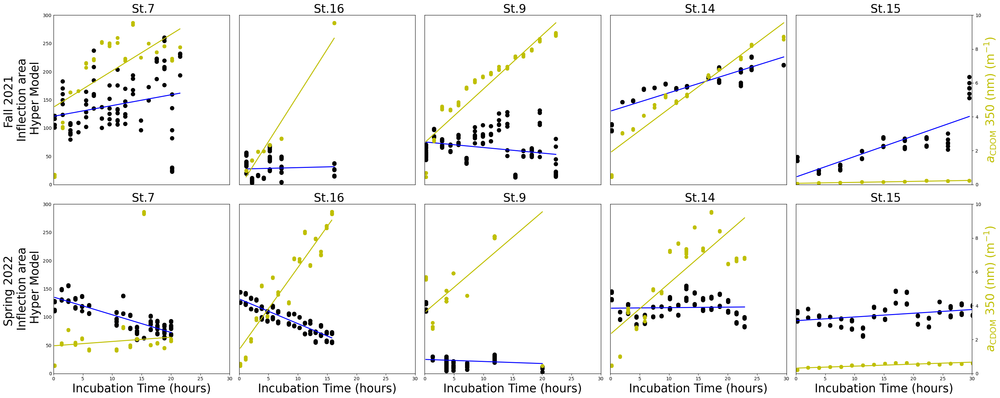

In [29]:
trips = ['GOM21FA', 'GOM22SP']
stations = ['St.7', 'St.16', 'St.9', 'St.14', 'St.15']

fig, axes = plt.subplots(len(trips), len(stations), figsize=(len(stations) * 6, len(trips) * 6))

for i, trip in enumerate(trips):
    for j, station in enumerate(stations):

        subset_df_hm = df_hm[(df_hm['Trip'] == trip) & (df_hm['Station'] == station)]
        subset_df_hm = subset_df_hm[(subset_df_hm['Triangel_hm'] < 400) & (subset_df_hm['Triangel_hm'] < 400)]
        subset = subset_df_hm[(subset_df_hm['Triangel_hm'] < 400) & (subset_df_hm['Triangel_hm'] < 400)]
        
        axes[i, j].scatter(subset_df_hm["BC_time"], subset_df_hm["Triangel_hm"], color='black', s=70)

        # Set common properties outside if-conditions
        axes[i, j].set_ylim(0, 300)
        axes[i, j].set_xlim(0, 30)
        axes[i, j].set_title(f' {station}', size=25)

        axes[i, j].set_ylabel('')
        axes[i, j].tick_params(axis='y', length=0, width=0)

        clean_data = subset_df_hm[["BC_time", "Triangel_hm"]].dropna()
        if len(clean_data) > 10:
            slope_fe2, intercept_fe2, r_value_fe2, _, _ = linregress(clean_data["BC_time"], clean_data["Triangel_hm"])
            x_range_fe2 = np.linspace(clean_data["BC_time"].min(), clean_data["BC_time"].max(), 100)
            axes[i, j].plot(x_range_fe2, slope_fe2 * x_range_fe2 + intercept_fe2, color='b', linewidth=2)

        if not subset.empty:
            axes2 = axes[i, j].twinx()  # Use twinx() instead of twiny()
            axes2.scatter(subset["BC_time"], subset["a350"], color='y', s=50)
            
        if len(subset) > 10:
            slope, intercept, r_value, _, _ = linregress(subset["BC_time"], subset["a350"])
            x_range = np.linspace(subset["BC_time"].min(), subset["BC_time"].max(), 100)
            axes2.plot(x_range, slope * x_range + intercept, color='y', linewidth=2)

        if i == 1:
            axes[i, j].set_xlabel('Incubation Time (hours)', size=25, c='black')
        else:
            axes[i, j].xaxis.set_ticklabels([])
            axes[i, j].set_xticks([])
            axes2.xaxis.set_ticklabels([])
            axes2.set_xticks([])

        if j == 0:
            if i == 0:
                axes[i, j].set_ylabel(f'Fall 2021 \n Inflection area \n Hyper Model', size=25, c='black')
            if i == 1:
                axes[i, j].set_ylabel(f'Spring 2022 \n Inflection area \n Hyper Model', size=25, c='black')
        else:
            axes[i, j].yaxis.set_ticklabels([])
            axes[i, j].set_yticks([])
            
        if j == 4: 
            axes2.set_ylabel(r'$a_{\mathrm{CDOM}}$ 350 (nm) (m$^{-1}$)', size=25, c='y')
            axes2.yaxis.set_ticks_position('right')  # Adjust ticks to the right side
            #axes2.yaxis.set_label_position('left')
            axes2.spines["right"].set_position(("axes", 1))  # Adjust the position here
            axes2.set_ylim(0, 10)
        else:
            axes2.yaxis.set_ticklabels([])
            axes2.set_yticks([])

# Display and save
fig.set_facecolor('w')
plt.tight_layout()

plt.savefig("../Dissertation_projects/Figures/350_inflec/Small_Benthic_chamber_FE_triangel_profiles.png")

plt.show()

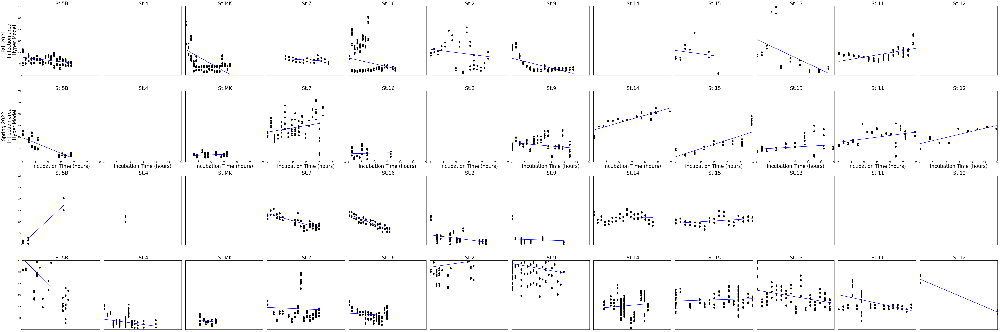

,bc_slope_inflec,r2_slope_inflec
code,,
St.5B_GOM2021,-1.311318,0.165722
St.4_GOM2021,-1.311318,0.165722
St.MK_GOM2021,-6.346800,0.246390
St.7_GOM2021,-0.598772,0.103836
St.16_GOM2021,-2.547182,0.056132
St.2_GOM2021,-1.430750,0.020903
St.9_GOM2021,-2.800241,0.422878
St.14_GOM2021,-2.800241,0.422878
St.15_GOM2021,-1.545282,0.012971


In [30]:
trips = ['GOM2021', 'GOM21FA', 'GOM22SP', 'GOM22SU']
stations = ['St.5B','St.4','St.MK','St.7','St.16','St.2','St.9','St.14','St.15','St.13','St.11','St.12']
Frames = []


fig, axes = plt.subplots(len(trips), len(stations), figsize=(len(stations)*6, len(trips)*6))

for i, trip in enumerate(trips):
    for j, station in enumerate(stations):
        
        subset_df_hm = df_hm[(df_hm['Trip'] == trip) & (df_hm['Station'] == station)]
        subset_df_hm = subset_df_hm[(subset_df_hm['Triangel_hm'] < 400) & (subset_df_hm['Triangel_hm'] < 400)]
        
        axes[i, j].scatter(subset_df_hm["BC_time"], subset_df_hm["Triangel_hm"], color='black', s = 70)
    
        # Set common properties outside if-conditions
        axes[i,j].set_ylim(0, 300)
        axes[i,j].set_xlim(0,30)
        axes[i, j].set_title(f' {station}', size=25)
        
        axes[i, j].set_ylabel('')
        axes[i, j].tick_params(axis='y', length=0, width=0)
        
        clean_data = subset_df_hm[["BC_time", "Triangel_hm"]].dropna()
        if len(clean_data) > 10: 
            slope_fe2, intercept_fe2, r_value_fe2, _, _ = linregress(clean_data["BC_time"], clean_data["Triangel_hm"])
            x_range_fe2 = np.linspace(clean_data["BC_time"].min(), clean_data["BC_time"].max(), 100)
            axes[i, j].plot(x_range_fe2, slope_fe2*x_range_fe2 + intercept_fe2, color='b', linewidth=2)
        
        if i == 1:
            axes[i,j].set_xlabel('Incubation Time (hours)', size=25, c='black')
        else:
            axes[i,j].xaxis.set_ticklabels([])
            axes[i,j].set_xticks([])

        if j == 0:
            if i == 0:
                axes[i,j].set_ylabel(f'Fall 2021 \n Inflection area \n Hyper Model', size=25, c='black')
            if i == 1: 
                axes[i,j].set_ylabel(f'Spring 2022 \n Inflection area \n Hyper Model', size=25, c='black')
        else:
            axes[i,j].yaxis.set_ticklabels([])
            axes[i,j].set_yticks([])
        
        code = station + '_' + trip
        r2 = r_value_fe2**2 
        
        dic = {'code':[code],
               'bc_slope_inflec':[slope_fe2],
               'r2_slope_inflec':[r2]}
        
        slopes = pd.DataFrame(dic)
        slopes = slopes.set_index('code', drop=True)
        Frames.append(slopes)

# Display and save
fig.set_facecolor('w')
plt.tight_layout()

slopes = pd.concat(Frames, axis=0, ignore_index=False)
slopes.to_csv('../Dissertation_projects/Data/Stats_data_sets/Flux_inflection_bc.csv')
plt.savefig("../Dissertation_projects/Figures/350_inflec/Benthic_chamber_FE_triangel_profiles_regress.png")


plt.show()
slopes

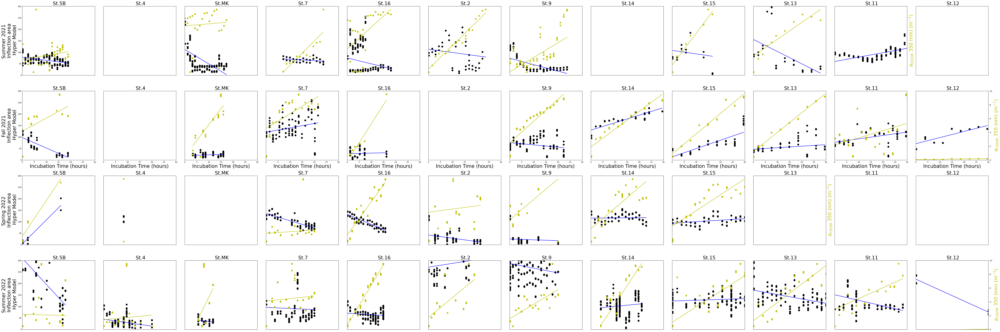

In [31]:
trips = ['GOM2021', 'GOM21FA', 'GOM22SP', 'GOM22SU']
stations = ['St.5B','St.4','St.MK','St.7','St.16','St.2','St.9','St.14','St.15','St.13','St.11','St.12']
Frames = []


fig, axes = plt.subplots(len(trips), len(stations), figsize=(len(stations)*6, len(trips)*6))

for i, trip in enumerate(trips):
    for j, station in enumerate(stations):
        
        subset_df_hm = df_hm[(df_hm['Trip'] == trip) & (df_hm['Station'] == station)]
        subset_df_hm = subset_df_hm[(subset_df_hm['Triangel_hm'] < 400) & (subset_df_hm['Triangel_hm'] < 400)]
        subset = subset_df_hm[(subset_df_hm['Triangel_hm'] < 400) & (subset_df_hm['Triangel_hm'] < 400)]

        axes[i, j].scatter(subset_df_hm["BC_time"], subset_df_hm["Triangel_hm"], color='black', s=70)

        # Set common properties outside if-conditions
        axes[i, j].set_ylim(0, 300)
        axes[i, j].set_xlim(0, 30)
        axes[i, j].set_title(f' {station}', size=25)

        axes[i, j].set_ylabel('')
        axes[i, j].tick_params(axis='y', length=0, width=0)

        clean_data = subset_df_hm[["BC_time", "Triangel_hm"]].dropna()
        if len(clean_data) > 10:
            slope_fe2, intercept_fe2, r_value_fe2, _, _ = linregress(clean_data["BC_time"], clean_data["Triangel_hm"])
            x_range_fe2 = np.linspace(clean_data["BC_time"].min(), clean_data["BC_time"].max(), 100)
            axes[i, j].plot(x_range_fe2, slope_fe2 * x_range_fe2 + intercept_fe2, color='b', linewidth=2)

        if not subset.empty:
            axes2 = axes[i, j].twinx()  # Use twinx() instead of twiny()
            axes2.scatter(subset["BC_time"], subset["a350"], color='y', s=50)
            
        if len(subset) > 10:
            slope, intercept, r_value, _, _ = linregress(subset["BC_time"], subset["a350"])
            x_range = np.linspace(subset["BC_time"].min(), subset["BC_time"].max(), 100)
            axes2.plot(x_range, slope * x_range + intercept, color='y', linewidth=2)

        if i == 1:
            axes[i, j].set_xlabel('Incubation Time (hours)', size=25, c='black')
        else:
            axes[i, j].xaxis.set_ticklabels([])
            axes[i, j].set_xticks([])
            axes2.xaxis.set_ticklabels([])
            axes2.set_xticks([])

        if j == 0:
            if i == 0:
                axes[i, j].set_ylabel(f'Summer 2021 \n Inflection area \n Hyper Model', size=25, c='black')
            if i == 1:
                axes[i, j].set_ylabel(f'Fall 2021 \n Inflection area \n Hyper Model', size=25, c='black')
            if i == 2:
                axes[i, j].set_ylabel(f'Spring 2022 \n Inflection area \n Hyper Model', size=25, c='black')
            if i == 3:
                axes[i, j].set_ylabel(f'Summer 2022 \n Inflection area \n Hyper Model', size=25, c='black')
        else:
            axes[i, j].yaxis.set_ticklabels([])
            axes[i, j].set_yticks([])
            
        if j == 11: 
            axes2.set_ylabel(r'$a_{\mathrm{CDOM}}$ 350 (nm) (m$^{-1}$)', size=25, c='y')
            axes2.yaxis.set_ticks_position('right')  # Adjust ticks to the right side
            #axes2.yaxis.set_label_position('left')
            axes2.spines["right"].set_position(("axes", 1))  # Adjust the position here
            axes2.set_ylim(0, 10)
        else:
            axes2.yaxis.set_ticklabels([])
            axes2.set_yticks([])

# Display and save
fig.set_facecolor('w')
plt.tight_layout()

plt.savefig("../Dissertation_projects/Figures/350_inflec/Benthic_chamber_FE_triangel_profiles_regress.png")


plt.show()

In [32]:
df_hm_fe = df_hm.merge(df_iron_bc, left_index=True, right_index=True, how='left')
df_pl_fe = df_pl.merge(df_iron_bc, left_index=True, right_index=True, how='left')


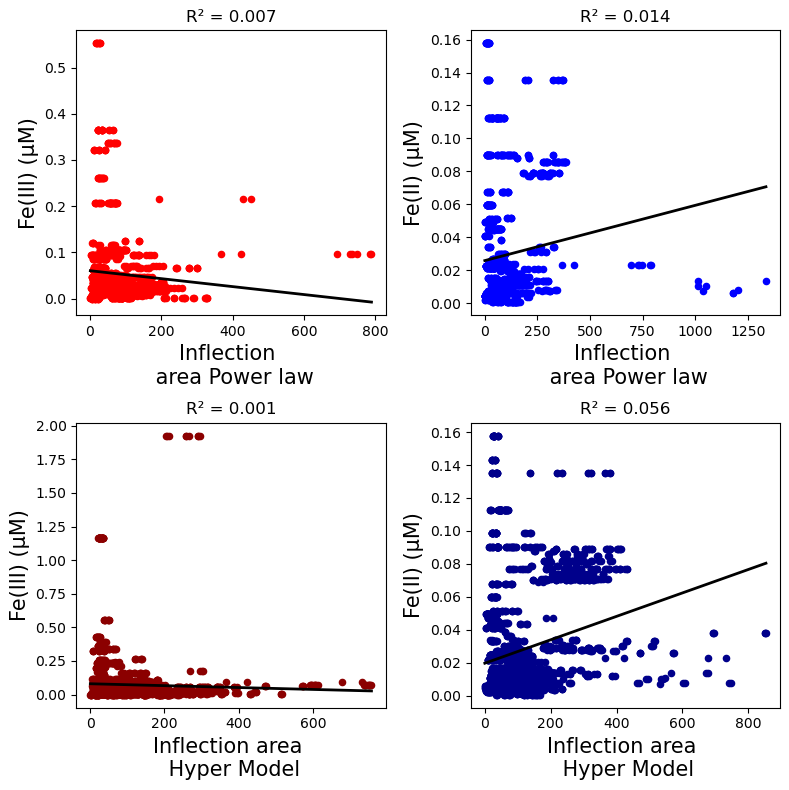

In [33]:
fig, axes = plt.subplots(2, 2, figsize=(8,8))

plots = [
    (df_pl_fe["Triangel_pl"], df_pl_fe["Fe3_uM"], 'r', 0, 0),
    (df_pl_fe["Triangel_pl"], df_pl_fe["Fe2_uM"], 'b', 0, 1),
    (df_hm_fe["Triangel_hm"], df_hm_fe["Fe3_uM"], 'darkred', 1, 0),
    (df_hm_fe["Triangel_hm"], df_hm_fe["Fe2_uM"], 'darkblue', 1, 1)
]

for x_data, y_data, color, i, j in plots:
    # Removing NaN values
    clean_data = pd.DataFrame({"x": x_data, "y": y_data}).dropna()
    x_clean = clean_data["x"]
    y_clean = clean_data["y"]
    
    slope, intercept, r_value, p_value, std_err = linregress(x_clean, y_clean)
    
    # Plotting scatter
    axes[i, j].scatter(x_clean, y_clean, color=color, s=20)
    
    # Plotting regression line
    x_range = np.linspace(min(x_clean), max(x_clean), 100)
    axes[i, j].plot(x_range, slope*x_range + intercept, color='black', linewidth=2)
    
    # Setting title as R^2 with superscript notation
    axes[i, j].set_title(f"R\u00B2 = {r_value**2:.3f}")

# Labeling axes
ylabel_texts = ['Fe(III) (\u03BCM)', 'Fe(II) (\u03BCM)', 'Fe(III) (\u03BCM)', 'Fe(II) (\u03BCM)']
xlabel_texts = ['Inflection \n area Power law', 'Inflection \n area Power law', 'Inflection area \n Hyper Model', 'Inflection area \n Hyper Model']

for ax, ylabel, xlabel in zip(axes.flat, ylabel_texts, xlabel_texts):
    ax.set_ylabel(ylabel, size=15)
    ax.set_xlabel(xlabel, size=15)

# Display and save
fig.set_facecolor('w')
plt.tight_layout()

plt.savefig("../Dissertation_projects/Figures/350_inflec/Pore_water_FE_triangel_full.png")


plt.show()


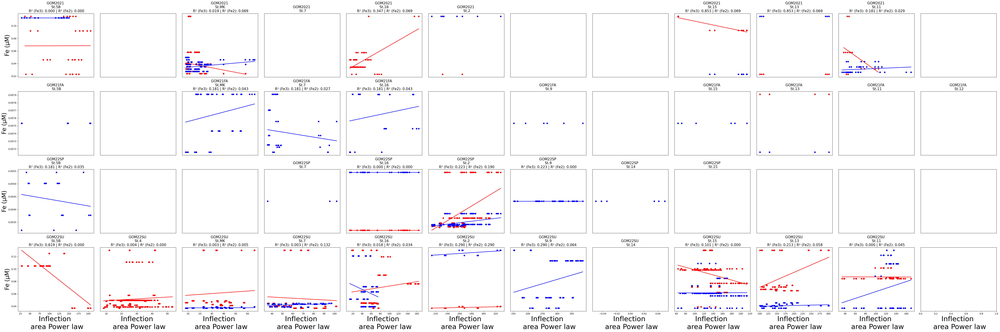

In [34]:
fig, axes = plt.subplots(len(trips), len(stations), figsize=(len(stations)*5, len(trips)*5))

for i, trip in enumerate(trips):
    for j, station in enumerate(stations):
        
        subset_df = df_pl_fe[(df_pl_fe['Trip'] == trip) & (df_pl_fe['Station'] == station)]
        
        if not subset_df.empty:
            # Vectorized plotting for Fe3_uM
            axes[i, j].scatter(subset_df["Triangel_pl"], subset_df["Fe3_uM"], color='r', s=30)
            
            # Removing NaN values and plotting regression for Fe3_uM
            
            clean_data_fe3 = subset_df[["Triangel_pl", "Fe3_uM"]].dropna()
            if len(clean_data_fe3) > 10: 
                slope_fe3, intercept_fe3, r_value_fe3, _, _ = linregress(clean_data_fe3["Triangel_pl"], clean_data_fe3["Fe3_uM"])
                x_range_fe3 = np.linspace(clean_data_fe3["Triangel_pl"].min(), clean_data_fe3["Triangel_pl"].max(), 100)
                axes[i, j].plot(x_range_fe3, slope_fe3*x_range_fe3 + intercept_fe3, color='r', linewidth=2)

            # Vectorized plotting for Fe2_uM
            axes[i, j].scatter(subset_df["Triangel_pl"], subset_df["Fe2_uM"], color='b', s=30)
            
            # Removing NaN values and plotting regression for Fe2_uM
            clean_data_fe2 = subset_df[["Triangel_pl", "Fe2_uM"]].dropna()
            if len(clean_data_fe2) > 10: 
                slope_fe2, intercept_fe2, r_value_fe2, _, _ = linregress(clean_data_fe2["Triangel_pl"], clean_data_fe2["Fe2_uM"])
                x_range_fe2 = np.linspace(clean_data_fe2["Triangel_pl"].min(), clean_data_fe2["Triangel_pl"].max(), 100)
                axes[i, j].plot(x_range_fe2, slope_fe2*x_range_fe2 + intercept_fe2, color='b', linewidth=2)

            # Set title with R^2 for both Fe3_uM and Fe2_uM
            if len(clean_data_fe3) + len(clean_data_fe2) > 10:
                axes[i, j].set_title(f'{trip} \n {station} \n R\u00B2 (Fe3): {r_value_fe3**2:.3f} | R\u00B2 (Fe2): {r_value_fe2**2:.3f}', size=15)
            else: 
                axes[i, j].set_title(f'{trip} \n {station}', size=15)
                
        # Set other properties
        if j == 0:
            axes[i, j].set_ylabel('Fe (\u03BCM)', size=25, c='black')
        else:
            axes[i, j].yaxis.set_ticklabels([])
            axes[i, j].set_yticks([])

        if i == len(trips) - 1:  # Using dynamic length in case the number of trips changes
            axes[i, j].set_xlabel(f'Inflection \n area Power law', size=30, c='black')
        else:
            axes[i, j].xaxis.set_ticklabels([])
            axes[i, j].set_xticks([])

# Display and save
fig.set_facecolor('w')
plt.tight_layout()

plt.savefig("../Dissertation_projects/Figures/350_inflec/Pore_water_FE_PL_triangel_corolations.png")

plt.show()


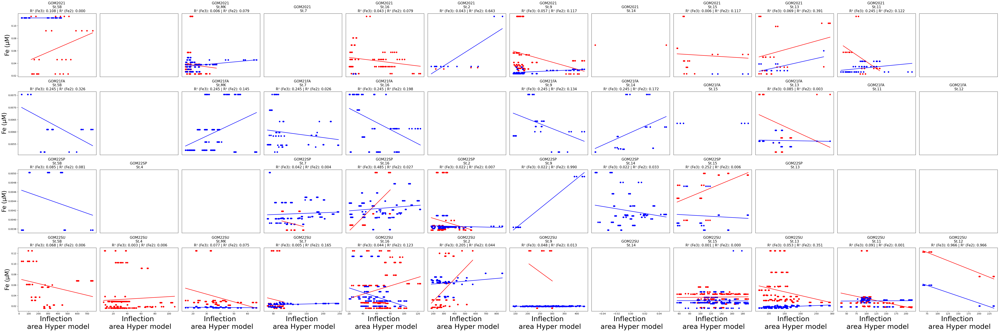

In [35]:
fig, axes = plt.subplots(len(trips), len(stations), figsize=(len(stations)*5, len(trips)*5))

for i, trip in enumerate(trips):
    for j, station in enumerate(stations):
        
        subset_df = df_hm_fe[(df_hm_fe['Trip'] == trip) & (df_hm_fe['Station'] == station)]
        
        if not subset_df.empty:
            # Vectorized plotting for Fe3_uM
            axes[i, j].scatter(subset_df["Triangel_hm"], subset_df["Fe3_uM"], color='r', s=30)
            
            # Removing NaN values and plotting regression for Fe3_uM
            clean_data_fe3 = subset_df[["Triangel_hm", "Fe3_uM"]].dropna()
            if len(clean_data_fe3) > 10: 
                slope_fe3, intercept_fe3, r_value_fe3, _, _ = linregress(clean_data_fe3["Triangel_hm"], clean_data_fe3["Fe3_uM"])
                x_range_fe3 = np.linspace(clean_data_fe3["Triangel_hm"].min(), clean_data_fe3["Triangel_hm"].max(), 100)
                axes[i, j].plot(x_range_fe3, slope_fe3*x_range_fe3 + intercept_fe3, color='r', linewidth=2)

            # Vectorized plotting for Fe2_uM
            axes[i, j].scatter(subset_df["Triangel_hm"], subset_df["Fe2_uM"], color='b', s=30)
            
            # Removing NaN values and plotting regression for Fe2_uM
            clean_data_fe2 = subset_df[["Triangel_hm", "Fe2_uM"]].dropna()
            if len(clean_data_fe2) > 10: 
                slope_fe2, intercept_fe2, r_value_fe2, _, _ = linregress(clean_data_fe2["Triangel_hm"], clean_data_fe2["Fe2_uM"])
                x_range_fe2 = np.linspace(clean_data_fe2["Triangel_hm"].min(), clean_data_fe2["Triangel_hm"].max(), 100)
                axes[i, j].plot(x_range_fe2, slope_fe2*x_range_fe2 + intercept_fe2, color='b', linewidth=2)

            # Set title with R^2 for both Fe3_uM and Fe2_uM
            if len(clean_data_fe3) + len(clean_data_fe2) > 10:
                axes[i, j].set_title(f'{trip} \n {station} \n R\u00B2 (Fe3): {r_value_fe3**2:.3f} | R\u00B2 (Fe2): {r_value_fe2**2:.3f}', size=15)
            else: 
                axes[i, j].set_title(f'{trip} \n {station}', size=15)

        # Set other properties
        if j == 0:
            axes[i, j].set_ylabel('Fe (\u03BCM)', size=25, c='black')
        else:
            axes[i, j].yaxis.set_ticklabels([])
            axes[i, j].set_yticks([])

        if i == len(trips) - 1:  # Using dynamic length in case the number of trips changes
            axes[i, j].set_xlabel(f'Inflection \n area Hyper model', size=30, c='black')
        else:
            axes[i, j].xaxis.set_ticklabels([])
            axes[i, j].set_xticks([])

# Display and save
fig.set_facecolor('w')
plt.tight_layout()

plt.savefig("../Dissertation_projects/Figures/350_inflec/Pore_water_FE_HM_triangel_corolations.png")

plt.show()
